# Load packages and data

In [1]:
import yaml

with open('/Users/kevinfinn/Documents/Bay ML/bayesml.yml', 'r') as yaml_file:
    data = yaml.safe_load(yaml_file)

In [2]:
import pymc as pm
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
from scipy import special, stats
import numpy as np

from sklearn.preprocessing import StandardScaler
import seaborn as sns

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
teampitch2022 = pd.read_csv('/Users/kevinfinn/Downloads/team standard pitching 2022.csv')
teampitch2023 = pd.read_csv('/Users/kevinfinn/Downloads/team standard pitching 2023.csv')
teamhit2022 = pd.read_csv('/Users/kevinfinn/Downloads/team standard batting 2022.csv')
teamhit2023 = pd.read_csv('/Users/kevinfinn/Downloads/team standard batting 2023.csv')
teamfield2022 = pd.read_csv('/Users/kevinfinn/Downloads/team standard fielding 2022.csv')
teamfield2023 = pd.read_csv('/Users/kevinfinn/Downloads/team standard fielding 2023.csv')
standings2022 = pd.read_csv('/Users/kevinfinn/Downloads/standings 2022.csv')
standings2023 = pd.read_csv('/Users/kevinfinn/Downloads/standings 2023.csv')

# Data cleaning

In [4]:
teampitch2022=teampitch2022[0:30]
teampitch2023=teampitch2023[0:30]
teamhit2022=teamhit2022[0:30]
teamhit2023=teamhit2023[0:30]
teamfield2022=teamfield2022[0:30]
teamfield2023=teamfield2023[0:30]
standings2022=standings2022[0:30]
standings2023=standings2023[0:30]

In [5]:
teampitch2022['Tm']=teampitch2022['Tm'].replace('\.','',regex=True)
teampitch2023['Tm']=teampitch2023['Tm'].replace('\.','',regex=True)

teamfield2022['Tm']=teamfield2022['Tm'].replace('\.','',regex=True)
teamfield2023['Tm']=teamfield2023['Tm'].replace('\.','',regex=True)
teamhit2023['Tm']=teamhit2023['Tm'].replace('\.','',regex=True)
teamhit2022['Tm']=teamhit2022['Tm'].replace('\.','',regex=True)

standings2023['Tm']=standings2023['Tm'].replace('\.','',regex=True)
standings2022['Tm']=standings2022['Tm'].replace('\.','',regex=True)

In [6]:
standings2023 = standings2023[['Tm', 'W']]
standings2022 = standings2022[['Tm', 'W']]

In [7]:
standings2022 = standings2022.sort_values(by='Tm')
standings2023 = standings2023.sort_values(by='Tm')

In [8]:
keep_pitching = ['Tm','ERA+','SV','H','R','HR','BB','SO','ER','HBP']
keep_hitting = ['Tm', 'R','H','2B','3B','HR','SB', 'BB', 'SO', 'CS', 'OPS+'] 
keep_fielding = ['Tm', 'E', 'DP', 'Ch', 'Rtot']

In [9]:
teampitch2022 = teampitch2022[keep_pitching]
teampitch2023 = teampitch2022[keep_pitching]
teamhit2022 = teamhit2022[keep_hitting]
teamhit2023 = teamhit2023[keep_hitting]
teamfield2022 = teamfield2022[keep_fielding]
teamfield2022 = teamfield2022[keep_fielding]

In [10]:
teamhit2022 = teamhit2022.set_index('Tm').join(standings2022.set_index('Tm')).reset_index()
teamfield2022 = teamfield2022.set_index('Tm').join(standings2022.set_index('Tm')).reset_index()
teampitch2022 = teampitch2022.set_index('Tm').join(standings2022.set_index('Tm')).reset_index()
teampitch2023 = teampitch2023.set_index('Tm').join(standings2023.set_index('Tm')).reset_index()
teamhit2023 = teamhit2023.set_index('Tm').join(standings2023.set_index('Tm')).reset_index()
teamfield2023 = teamfield2023.set_index('Tm').join(standings2023.set_index('Tm')).reset_index()

In [11]:
teamhitstats2022 = teamhit2022[['R','H','2B','3B','HR','SB', 'BB', 'SO', 'CS', 'OPS+']]

In [12]:
teamhitstats2023 = teamhit2023[['R','H','2B','3B','HR','SB', 'BB', 'SO', 'CS', 'OPS+']]
teamwinstats2023_hits = teamhit2023[['W']]

In [13]:
teampitchstats2023 = teampitch2023[['ERA+','SV','H','R','HR','BB','SO','ER','HBP']]
teamwinstats2023_pitch = teampitch2023[['W']]

In [14]:
teampitchstats2022 = teampitch2022[['ERA+','SV','H','R','HR','BB','SO','ER','HBP']]
teamwinstats2022_pitch = teampitch2022[['W']]

In [15]:
teamfieldstats2022 = teamfield2022[['E', 'DP', 'Ch', 'Rtot']]
teamwinstats2022_field = teamfield2022[['W']]

In [16]:
teamfieldstats2023 = teamfield2023[['E', 'DP', 'Ch', 'Rtot']]
teamwinstats2023_field = teamfield2023[['W']]

# Normalization

In [17]:
scaler = StandardScaler()
numeric_columns = teamhitstats2023.select_dtypes(include=['int64', 'float64'])
teamhitstats2023[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

numeric_columns = teamhitstats2022.select_dtypes(include=['int64', 'float64'])
teamhitstats2022[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

numeric_columns = teampitchstats2023.select_dtypes(include=['int64', 'float64'])
teampitchstats2023[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

numeric_columns = teampitchstats2022.select_dtypes(include=['int64', 'float64'])
teampitchstats2022[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

numeric_columns = teamfieldstats2022.select_dtypes(include=['int64', 'float64'])
teamfieldstats2022[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

numeric_columns = teamfieldstats2023.select_dtypes(include=['int64', 'float64'])
teamfieldstats2023[numeric_columns.columns] = scaler.fit_transform(numeric_columns)

/var/folders/l2/yg146pls5_q015mz26q0pyfm0000gn/T/ipykernel_19777/3770911358.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teamhitstats2023[numeric_columns.columns] = scaler.fit_transform(numeric_columns)
/var/folders/l2/yg146pls5_q015mz26q0pyfm0000gn/T/ipykernel_19777/3770911358.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teamhitstats2022[numeric_columns.columns] = scaler.fit_transform(numeric_columns)
/var/folders/l2/yg146pls5_q015mz26q0pyfm0000gn/T/ipykernel_19777/3770911358.py:9: SettingWit

# 2022 Hitting

In [18]:
teamhitstats2022_np=teamhitstats2022.to_numpy()
standings2022=standings2022['W']
standings2023=standings2023['W']

with pm.Model() as hit2022_model:

    X = pm.MutableData("X", teamhitstats2022_np)
    y = pm.MutableData("y", standings2022)

    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(10), Sigma = np.eye(10), shape = 10, dims = 'Predictors')

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)

In [19]:
with hit2022_model:
    hit2022_trace = pm.fit(5000, 
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])

Finished [100%]: Average Loss = 125.27


In [20]:
random_seed=485096

In [21]:
with hit2022_model:
    hit2022_prior = pm.sample_prior_predictive(random_seed=random_seed)

Sampling: [alpha, nu, obs, β, σ]


In [22]:
with hit2022_model:
    hit2022_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    hit2022_post = pm.sample_posterior_predictive(hit2022_sample, extend_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 4 seconds.
Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

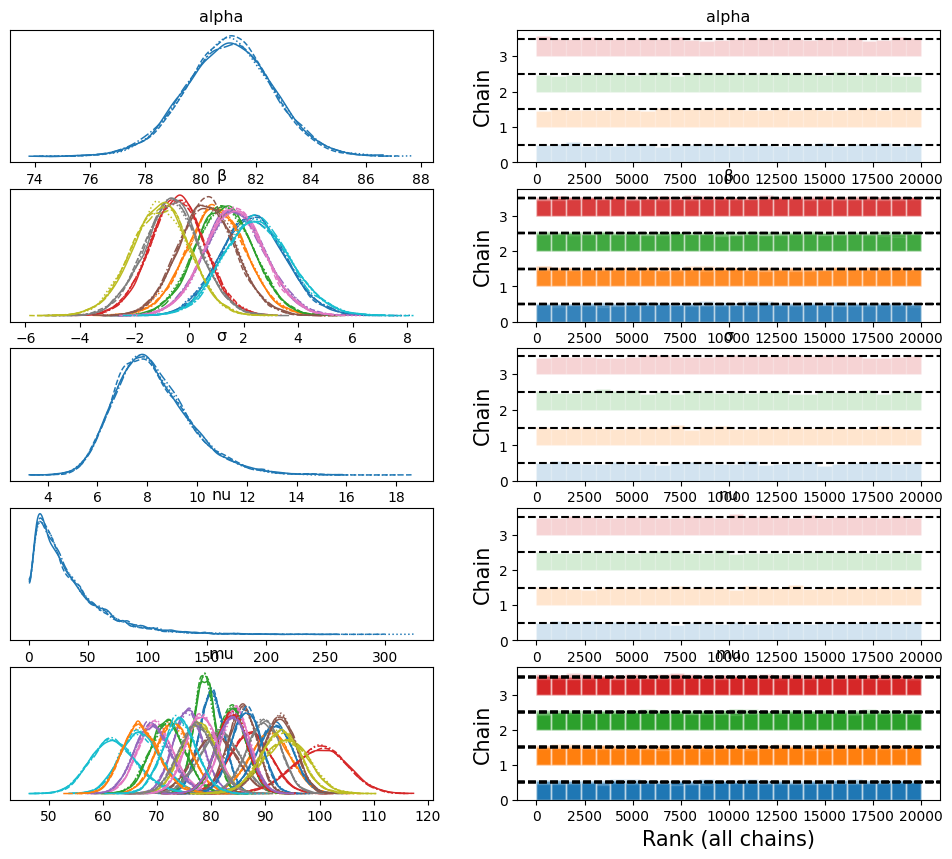

In [23]:
az.plot_trace(hit2022_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (43), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n4'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n5'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n6'}>,
        <Axes: title={'center': 'β\n6'}, xlabel='Rank

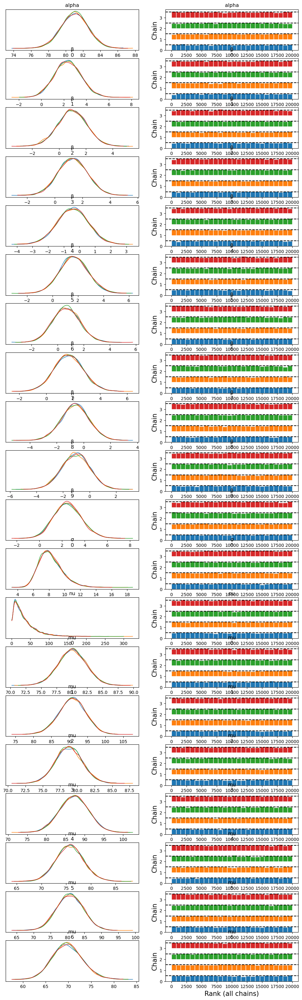

In [24]:
az.plot_trace(hit2022_sample, kind = 'rank_bars', compact=False)

In [25]:
az.summary(hit2022_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,81.023,1.596,78.174,84.196,0.009,0.006,32075.0,15029.0,1.0
β[0],2.349,1.199,0.035,4.531,0.006,0.005,34301.0,14674.0,1.0
β[1],0.985,1.107,-1.145,3.032,0.006,0.006,33269.0,14770.0,1.0
β[2],1.297,1.068,-0.629,3.379,0.006,0.005,37660.0,15166.0,1.0
β[3],-0.433,1.004,-2.300,1.476,0.005,0.007,38588.0,15117.0,1.0
β[4],1.683,1.133,-0.503,3.768,0.006,0.005,35370.0,15686.0,1.0
β[5],0.666,1.049,-1.226,2.720,0.006,0.006,32598.0,16282.0,1.0
β[6],1.668,1.097,-0.471,3.696,0.006,0.005,32591.0,15218.0,1.0
β[7],-0.628,1.050,-2.642,1.342,0.005,0.007,37177.0,16252.0,1.0
β[8],-1.051,1.072,-2.988,1.023,0.006,0.006,31604.0,15444.0,1.0


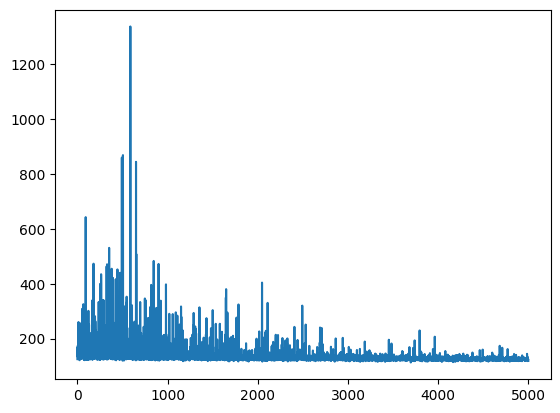

In [26]:
plt.plot(hit2022_trace.hist)

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (43) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n6'}>],
       [<Axes: title={'center': 'β\n7'}>,
        <Axes: title={'center': 'β\n8'}>,
        <Axes: title={'center': 'β\n9'}>,
        <Axes: title={'center': 'σ\n0'}>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>],
       [<Axes: title={'center': 'mu\n3'}>,
        <Axes: title={'center': 'mu\n4'}>,
        <Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>],
       [<Axes: title={'center': 'mu\n7'}>,
        <Axes: title={'center': 'mu\n8'}>,
        <Axes: title={'center': 'mu\n9'}>,
        <Axes: title

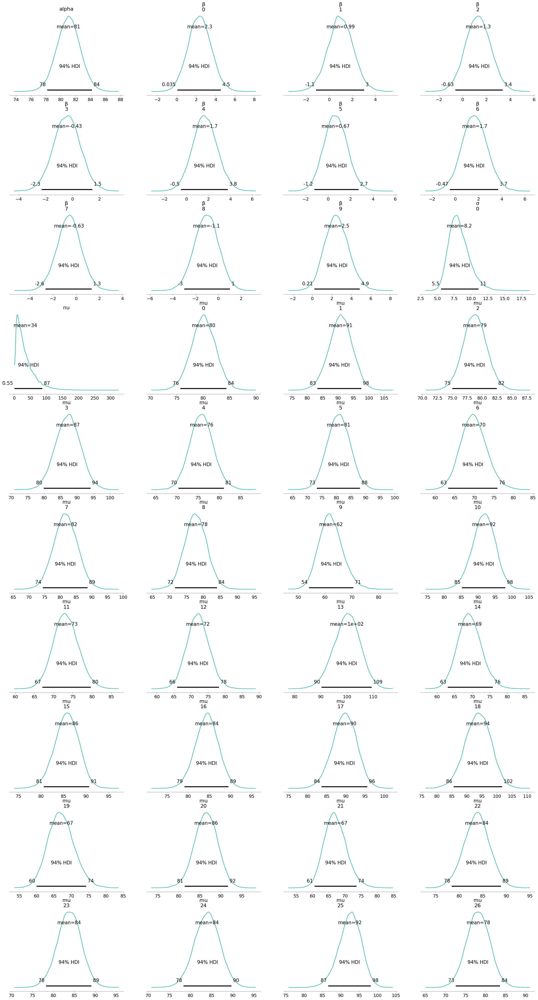

In [27]:
az.plot_posterior(hit2022_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

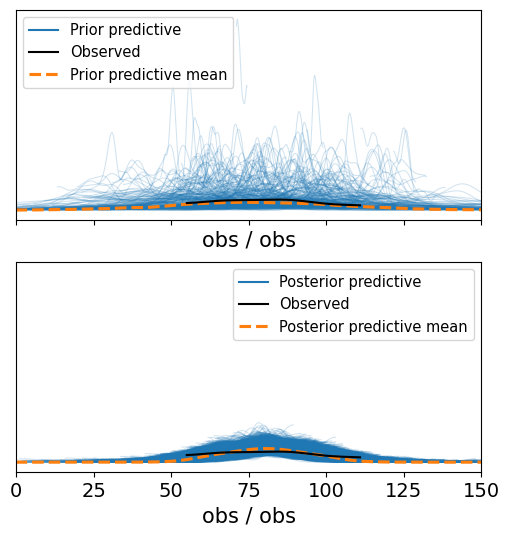

In [28]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(hit2022_prior, group = 'prior', ax=ax[0])
az.plot_ppc(hit2022_post, ax=ax[1])


# 2023 Hitting

In [30]:
teamhitstats2023_np=teamhitstats2023.to_numpy()

with pm.Model() as hit2023_model:

    X = pm.MutableData("X", teamhitstats2023_np)
    y = pm.MutableData("y", standings2023)
    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(10), Sigma = np.eye(10), shape = 10, dims = 'Predictors')

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)


In [31]:
with hit2023_model:
    hit2023_trace = pm.fit(5000,
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])

Finished [100%]: Average Loss = 122.39


In [32]:
with hit2023_model:
    hit2023_prior = pm.sample_prior_predictive(random_seed=random_seed)

Sampling: [alpha, nu, obs, β, σ]


In [33]:
with hit2023_model:
    hit2023_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    hit2023_post = pm.sample_posterior_predictive(hit2023_sample, extend_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 4 seconds.
Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

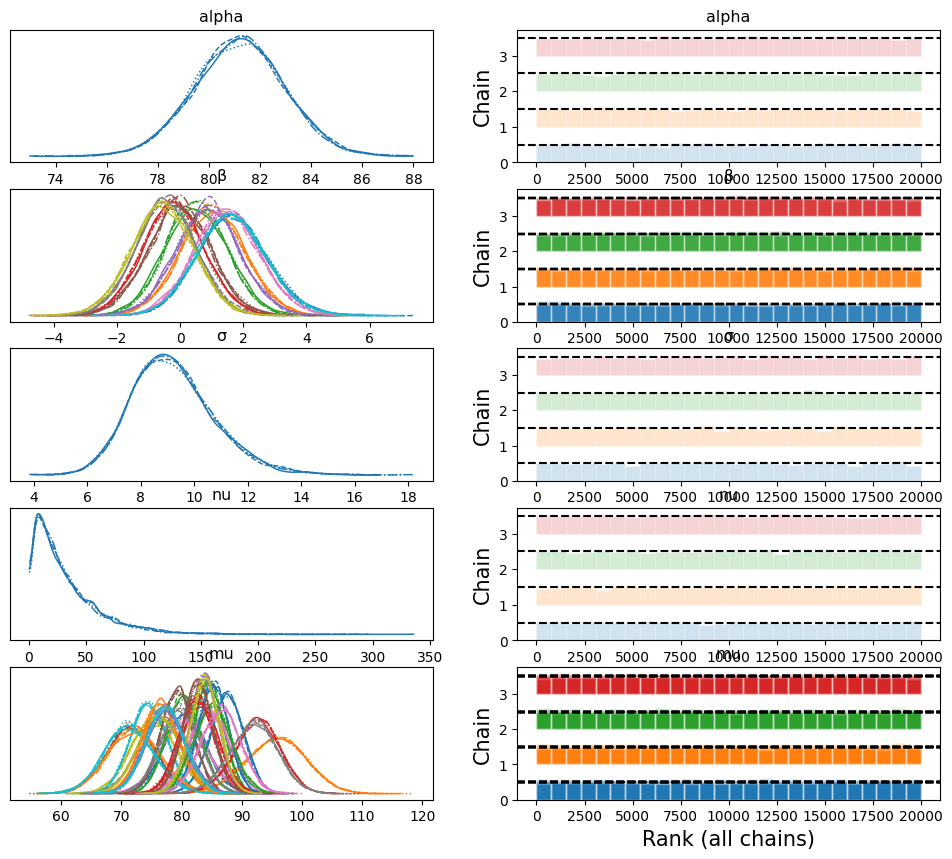

In [34]:
az.plot_trace(hit2023_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (43), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n4'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n5'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n6'}>,
        <Axes: title={'center': 'β\n6'}, xlabel='Rank

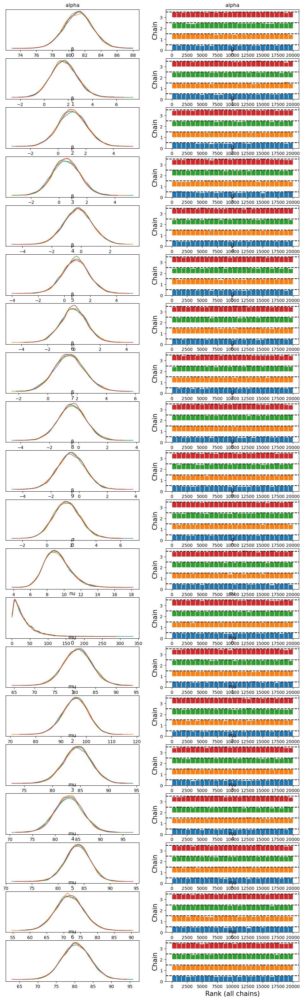

In [35]:
az.plot_trace(hit2023_sample, kind = 'rank_bars', compact=False)

In [36]:
az.summary(hit2023_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,81.183,1.791,77.766,84.475,0.010,0.007,32039.0,14638.0,1.0
β[0],1.660,1.110,-0.442,3.724,0.006,0.005,34065.0,16133.0,1.0
β[1],1.042,1.032,-0.887,3.014,0.006,0.005,33734.0,16547.0,1.0
β[2],0.514,0.979,-1.361,2.300,0.005,0.006,37285.0,15410.0,1.0
β[3],-0.204,0.976,-1.989,1.699,0.005,0.007,40520.0,16234.0,1.0
β[4],0.880,1.022,-1.018,2.843,0.005,0.006,36749.0,15263.0,1.0
β[5],-0.021,1.001,-1.885,1.875,0.005,0.008,36305.0,15680.0,1.0
β[6],1.495,1.049,-0.583,3.400,0.006,0.005,34084.0,16157.0,1.0
β[7],-0.438,0.960,-2.234,1.394,0.005,0.007,36076.0,15393.0,1.0
β[8],-0.559,0.997,-2.371,1.385,0.005,0.006,34752.0,14688.0,1.0


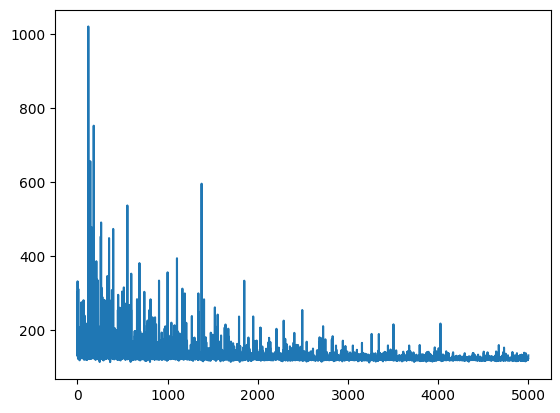

In [37]:
plt.plot(hit2023_trace.hist)

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (43) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n6'}>],
       [<Axes: title={'center': 'β\n7'}>,
        <Axes: title={'center': 'β\n8'}>,
        <Axes: title={'center': 'β\n9'}>,
        <Axes: title={'center': 'σ\n0'}>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>],
       [<Axes: title={'center': 'mu\n3'}>,
        <Axes: title={'center': 'mu\n4'}>,
        <Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>],
       [<Axes: title={'center': 'mu\n7'}>,
        <Axes: title={'center': 'mu\n8'}>,
        <Axes: title={'center': 'mu\n9'}>,
        <Axes: title

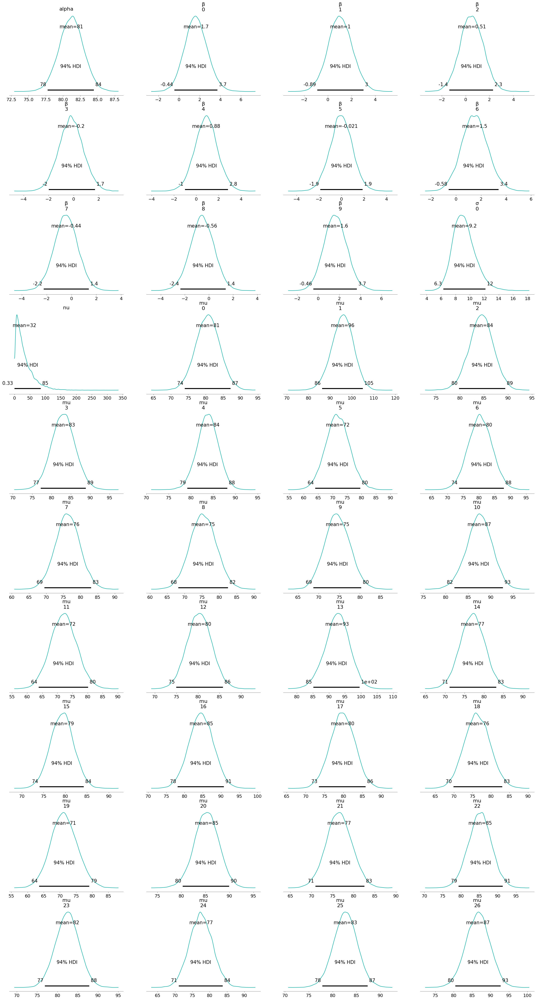

In [38]:
az.plot_posterior(hit2023_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

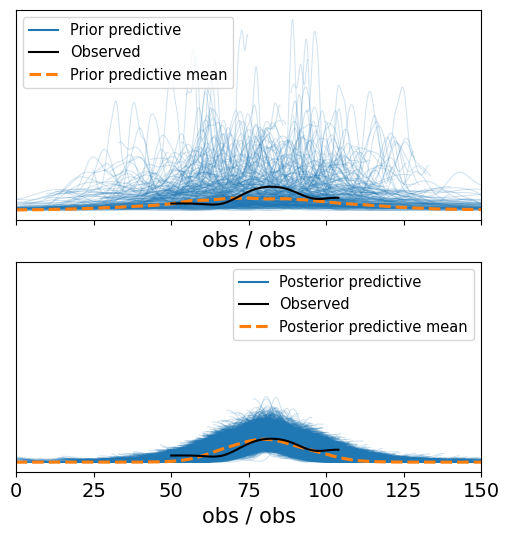

In [39]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(hit2023_prior, group = 'prior', ax=ax[0])
az.plot_ppc(hit2023_post, ax=ax[1])

# 2022 Pitching

In [40]:
teampitchstats2022_np=teampitchstats2022.to_numpy()

with pm.Model() as pitch2022_model:

    X = pm.MutableData("X", teampitchstats2022_np)
    y = pm.MutableData("y", standings2022)

    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(9), Sigma = np.eye(9), shape = 9)

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)


In [41]:
with pitch2022_model:
    pitch2022_trace = pm.fit(5000,
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])

Finished [100%]: Average Loss = 120.93


In [42]:
with pitch2022_model:
    pitch2022_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    pitch2022_prior = pm.sample_prior_predictive(random_seed = random_seed)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 5 seconds.
Sampling: [alpha, nu, obs, β, σ]


In [43]:
with pitch2022_model:
    pitch2022_post = pm.sample_posterior_predictive(pitch2022_sample, extend_inferencedata=True)

Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

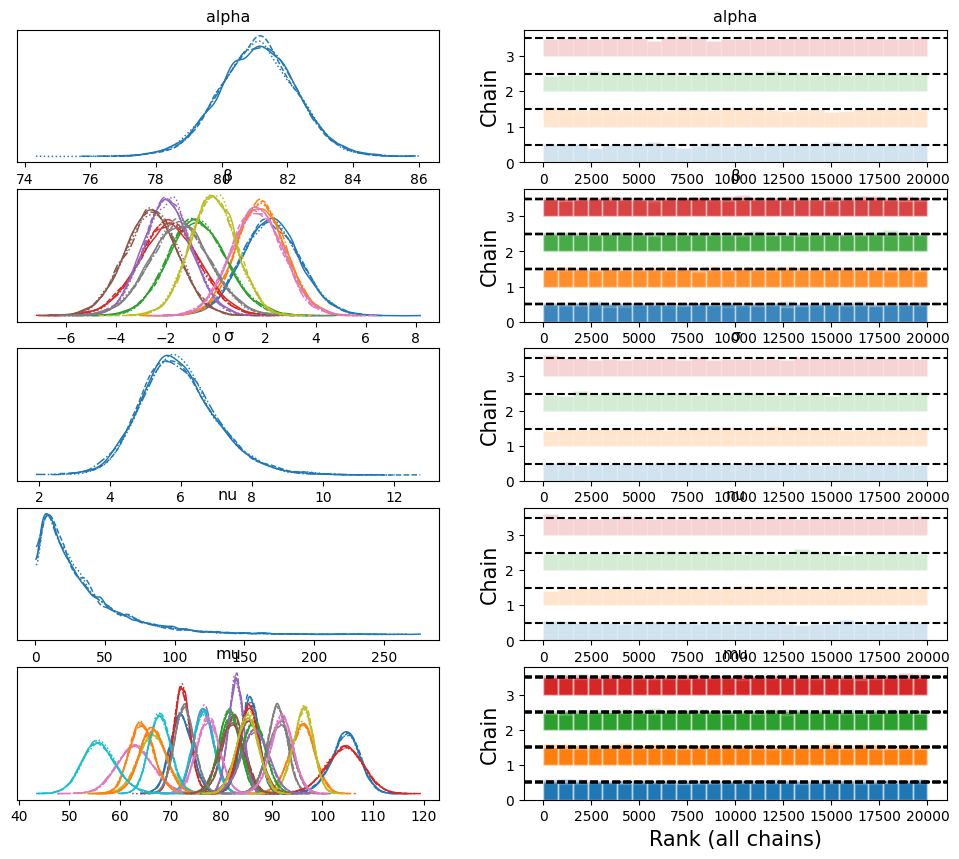

In [44]:
az.plot_trace(pitch2022_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (42), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n4'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n5'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n6'}>,
        <Axes: title={'center': 'β\n6'}, xlabel='Rank

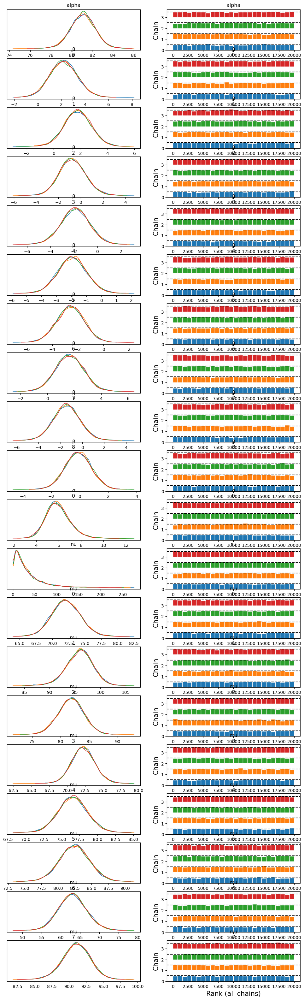

In [45]:
az.plot_trace(pitch2022_sample, kind = 'rank_bars', compact=False)

In [46]:
az.summary(pitch2022_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,81.084,1.178,78.883,83.286,0.007,0.005,28812.0,15440.0,1.0
β[0],2.199,1.179,-0.011,4.440,0.008,0.006,19829.0,14751.0,1.0
β[1],1.786,0.996,-0.121,3.621,0.006,0.005,26365.0,15677.0,1.0
β[2],-0.729,1.175,-2.931,1.479,0.008,0.007,19519.0,14167.0,1.0
β[3],-1.890,1.218,-4.227,0.361,0.009,0.007,19074.0,15183.0,1.0
β[4],-1.936,0.974,-3.720,-0.058,0.006,0.005,24346.0,15221.0,1.0
β[5],-2.594,1.069,-4.611,-0.610,0.008,0.006,19520.0,14275.0,1.0
β[6],1.645,1.045,-0.303,3.599,0.007,0.005,23683.0,15306.0,1.0
β[7],-1.430,1.228,-3.665,0.944,0.009,0.007,18220.0,14301.0,1.0
β[8],-0.116,0.925,-1.832,1.636,0.006,0.006,26481.0,15667.0,1.0


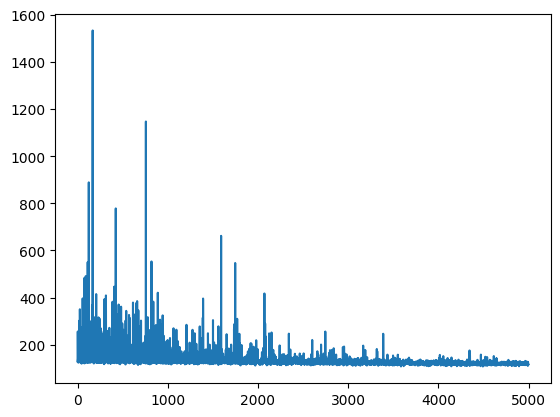

In [47]:
plt.plot(pitch2022_trace.hist)

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (42) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n6'}>],
       [<Axes: title={'center': 'β\n7'}>,
        <Axes: title={'center': 'β\n8'}>,
        <Axes: title={'center': 'σ\n0'}>, <Axes: title={'center': 'nu'}>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>,
        <Axes: title={'center': 'mu\n3'}>],
       [<Axes: title={'center': 'mu\n4'}>,
        <Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>,
        <Axes: title={'center': 'mu\n7'}>],
       [<Axes: title={'center': 'mu\n8'}>,
        <Axes: title={'center': 'mu\n9'}>,
        <Axes: title={'center': 'mu\n10'}>,
        <Axes: title={'cen

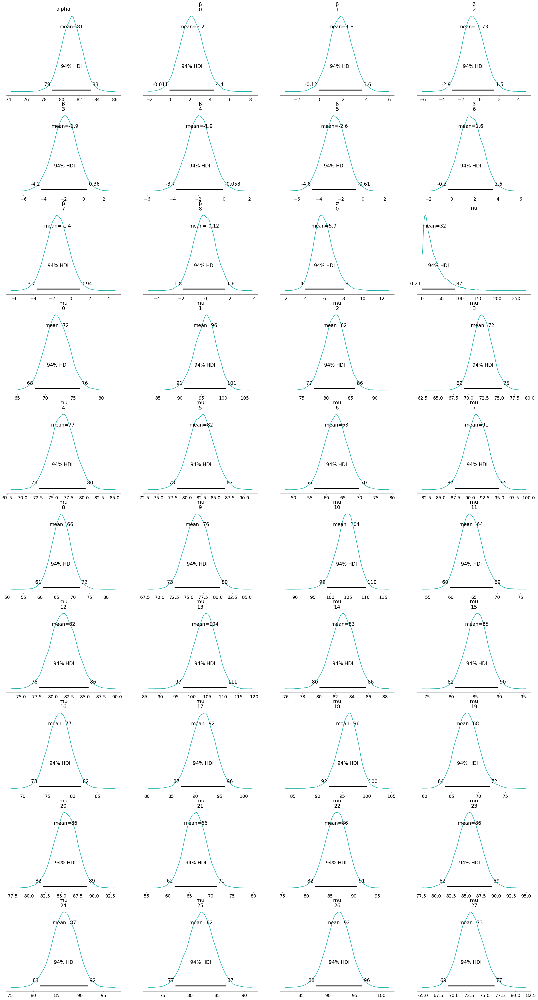

In [48]:
az.plot_posterior(pitch2022_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

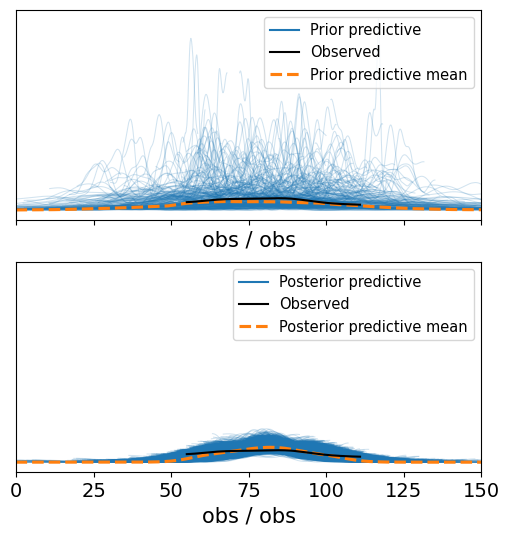

In [49]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(pitch2022_prior, group = 'prior', ax=ax[0])
az.plot_ppc(pitch2022_post, ax=ax[1])

# 2023 Pitching

In [50]:
teampitchstats2023_np=teampitchstats2023.to_numpy()
response_pitch2023=teamwinstats2023_pitch['W']

with pm.Model() as pitch2023_model:

    X = pm.MutableData("X", teampitchstats2023_np)
    y = pm.MutableData("y", standings2023)

    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(9), Sigma = np.eye(9), shape = 9)

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)

In [51]:
with pitch2023_model:
    pitch2023_trace = pm.fit(5000,
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])

Finished [100%]: Average Loss = 124.45


In [52]:
with pitch2023_model:
    pitch2023_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    pitch2023_prior = pm.sample_prior_predictive(random_seed = random_seed)
    pitch2023_post = pm.sample_posterior_predictive(pitch2023_sample, extend_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 4 seconds.
Sampling: [alpha, nu, obs, β, σ]
Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

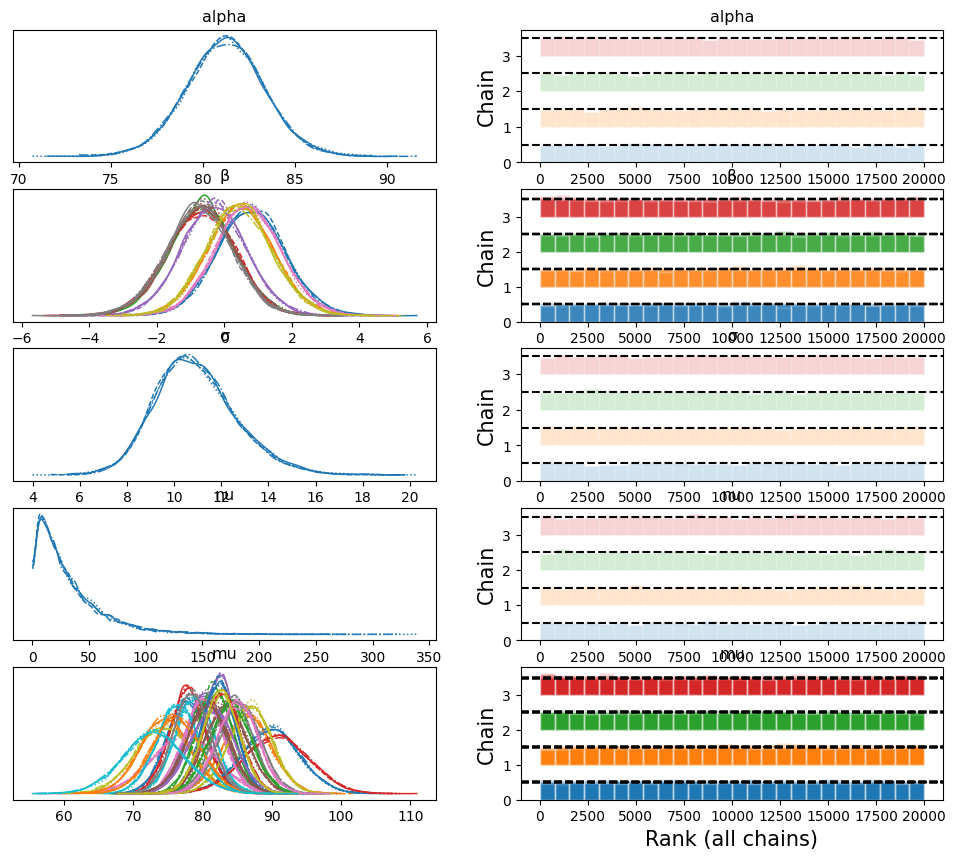

In [53]:
az.plot_trace(pitch2023_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (42), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n4'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n5'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n6'}>,
        <Axes: title={'center': 'β\n6'}, xlabel='Rank

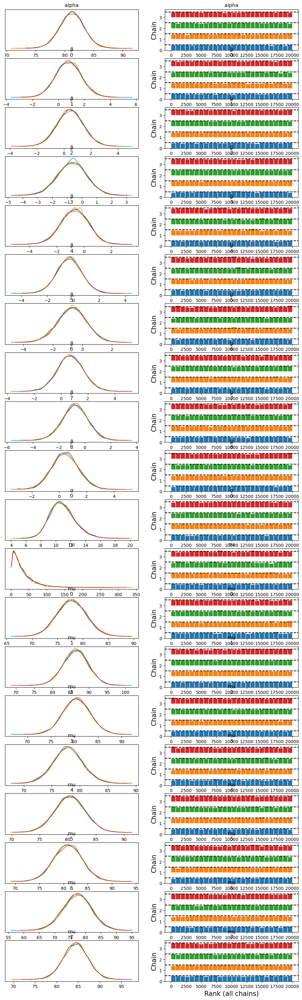

In [54]:
az.plot_trace(pitch2023_sample, kind = 'rank_bars', compact=False)

In [55]:
az.summary(pitch2023_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,81.229,2.149,77.218,85.344,0.012,0.009,30992.0,14357.0,1.0
β[0],0.799,1.012,-1.124,2.669,0.005,0.006,35477.0,14601.0,1.0
β[1],0.470,0.990,-1.415,2.317,0.005,0.007,37713.0,13819.0,1.0
β[2],-0.677,1.004,-2.588,1.195,0.005,0.006,35911.0,14834.0,1.0
β[3],-0.696,1.021,-2.651,1.175,0.006,0.006,33094.0,16525.0,1.0
β[4],-0.305,0.977,-2.159,1.541,0.005,0.007,34787.0,15008.0,1.0
β[5],-0.696,0.988,-2.545,1.177,0.005,0.006,36140.0,14277.0,1.0
β[6],0.698,0.992,-1.172,2.551,0.005,0.006,36783.0,15124.0,1.0
β[7],-0.747,1.004,-2.614,1.183,0.005,0.006,35707.0,15583.0,1.0
β[8],0.442,0.984,-1.422,2.270,0.005,0.007,32873.0,13952.0,1.0


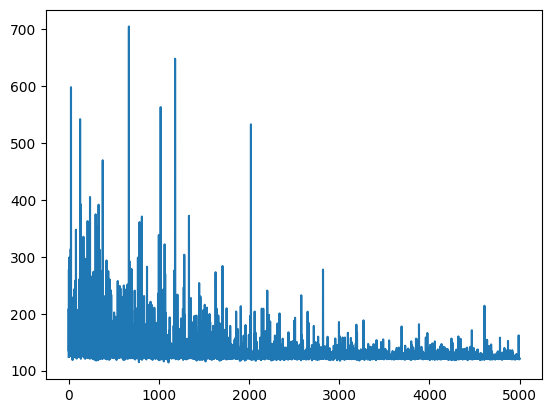

In [56]:
plt.plot(pitch2023_trace.hist)

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (42) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n4'}>,
        <Axes: title={'center': 'β\n5'}>,
        <Axes: title={'center': 'β\n6'}>],
       [<Axes: title={'center': 'β\n7'}>,
        <Axes: title={'center': 'β\n8'}>,
        <Axes: title={'center': 'σ\n0'}>, <Axes: title={'center': 'nu'}>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>,
        <Axes: title={'center': 'mu\n3'}>],
       [<Axes: title={'center': 'mu\n4'}>,
        <Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>,
        <Axes: title={'center': 'mu\n7'}>],
       [<Axes: title={'center': 'mu\n8'}>,
        <Axes: title={'center': 'mu\n9'}>,
        <Axes: title={'center': 'mu\n10'}>,
        <Axes: title={'cen

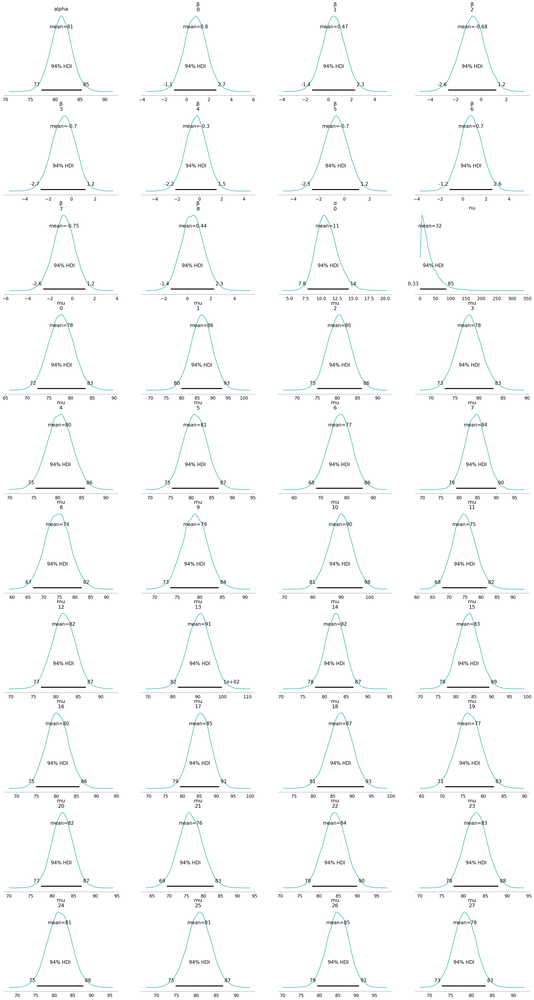

In [57]:
az.plot_posterior(pitch2023_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

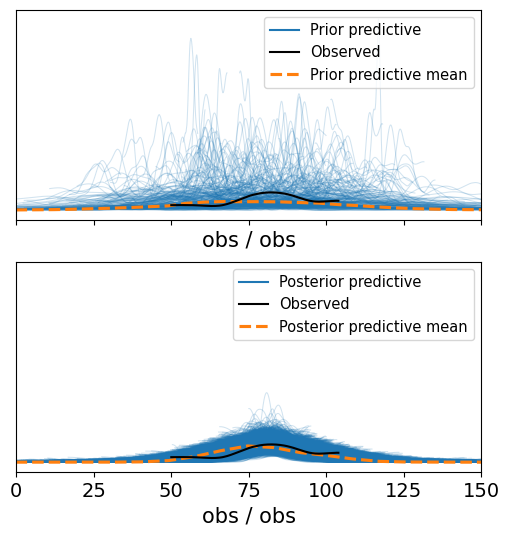

In [58]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(pitch2023_prior, group = 'prior', ax=ax[0])
az.plot_ppc(pitch2023_post, ax=ax[1])

# 2022 Fielding

In [59]:
teamfieldstats2022_np=teamfieldstats2022.to_numpy()
response_field2022=teamwinstats2022_field['W']

with pm.Model() as field2022_model:

    X = pm.MutableData("X", teamfieldstats2022_np)
    y = pm.MutableData("y", standings2022)

    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(4), Sigma = np.eye(4), shape = 4)

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)

In [60]:
with field2022_model:
    field2022_trace = pm.fit(5000,
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])


Finished [100%]: Average Loss = 129.48


In [61]:
with field2022_model:
    field2022_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    field2022_prior = pm.sample_prior_predictive(random_seed = random_seed)
    field2022_post = pm.sample_posterior_predictive(field2022_sample, extend_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 4 seconds.
Sampling: [alpha, nu, obs, β, σ]
Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

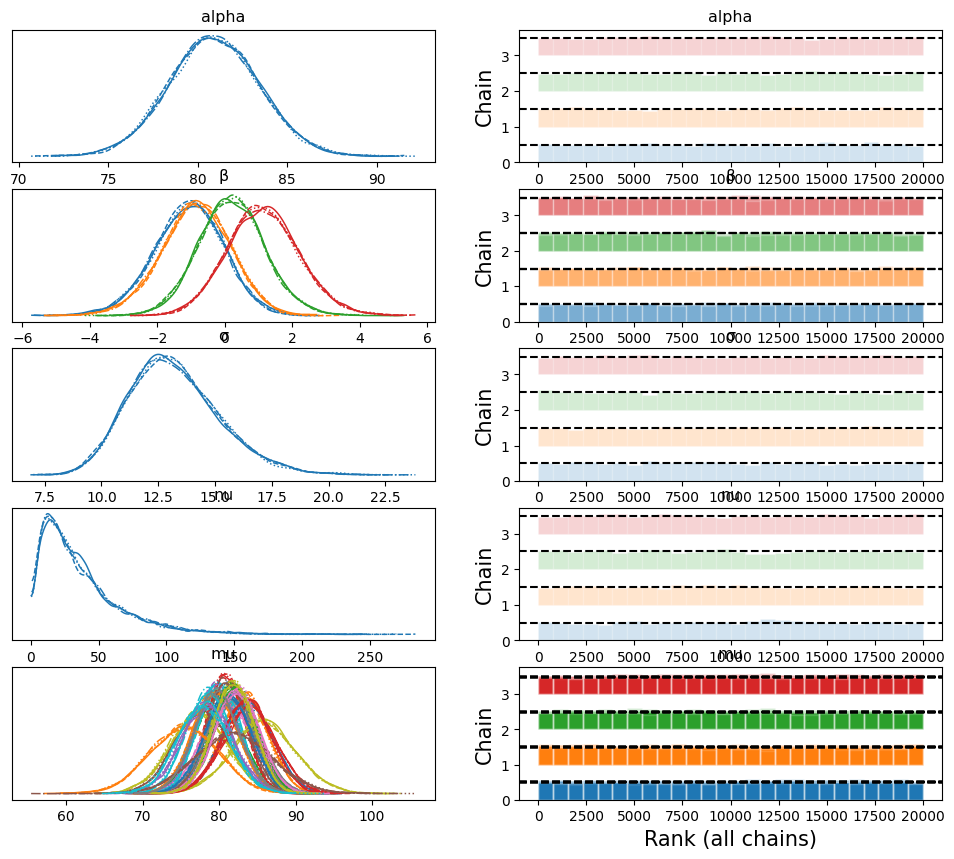

In [62]:
az.plot_trace(field2022_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (37), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ\n0'}>,
        <Axes: title={'center': 'σ\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n0'}, xlabel='Rank (

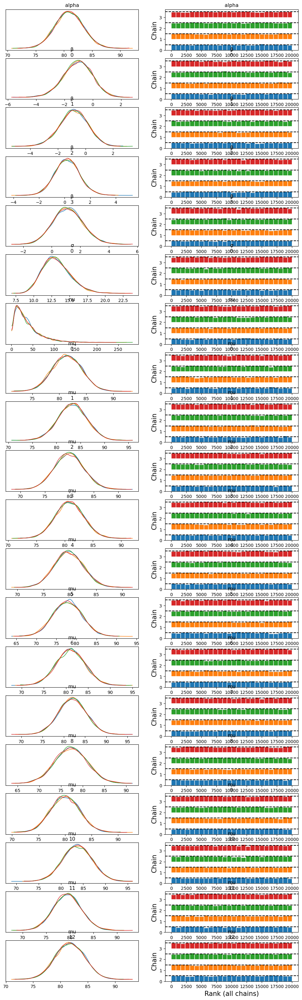

In [63]:
az.plot_trace(field2022_sample, kind = 'rank_bars', compact=False)

In [64]:
az.summary(field2022_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,80.934,2.551,76.207,85.774,0.018,0.012,21175.0,14953.0,1.0
β[0],-1.075,1.041,-3.089,0.824,0.007,0.006,22418.0,15051.0,1.0
β[1],-0.856,1.038,-2.815,1.079,0.007,0.006,22473.0,14846.0,1.0
β[2],0.213,0.993,-1.660,2.094,0.007,0.007,20665.0,14887.0,1.0
β[3],1.143,1.074,-0.863,3.163,0.008,0.006,19994.0,14891.0,1.0
σ[0],13.215,2.010,9.630,17.013,0.015,0.011,16995.0,15812.0,1.0
nu,36.475,29.937,1.427,91.020,0.200,0.155,20424.0,13972.0,1.0
mu[0],81.439,2.777,76.215,86.552,0.019,0.013,21265.0,15169.0,1.0
mu[1],83.305,3.039,77.660,89.089,0.021,0.015,20086.0,15241.0,1.0
mu[2],79.930,3.031,74.361,85.763,0.020,0.014,22188.0,15259.0,1.0


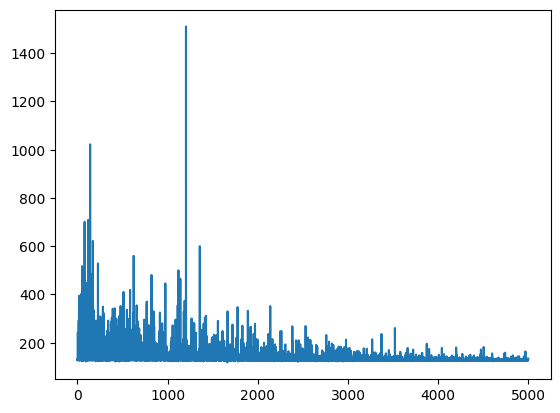

In [65]:
plt.plot(field2022_trace.hist)

array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'σ\n0'}>, <Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'mu\n0'}>],
       [<Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>,
        <Axes: title={'center': 'mu\n3'}>,
        <Axes: title={'center': 'mu\n4'}>],
       [<Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>,
        <Axes: title={'center': 'mu\n7'}>,
        <Axes: title={'center': 'mu\n8'}>],
       [<Axes: title={'center': 'mu\n9'}>,
        <Axes: title={'center': 'mu\n10'}>,
        <Axes: title={'center': 'mu\n11'}>,
        <Axes: title={'center': 'mu\n12'}>],
       [<Axes: title={'center': 'mu\n13'}>,
        <Axes: title={'center': 'mu\n14'}>,
        <Axes: title={'center': 'mu\n15'}>,
        <Axes: t

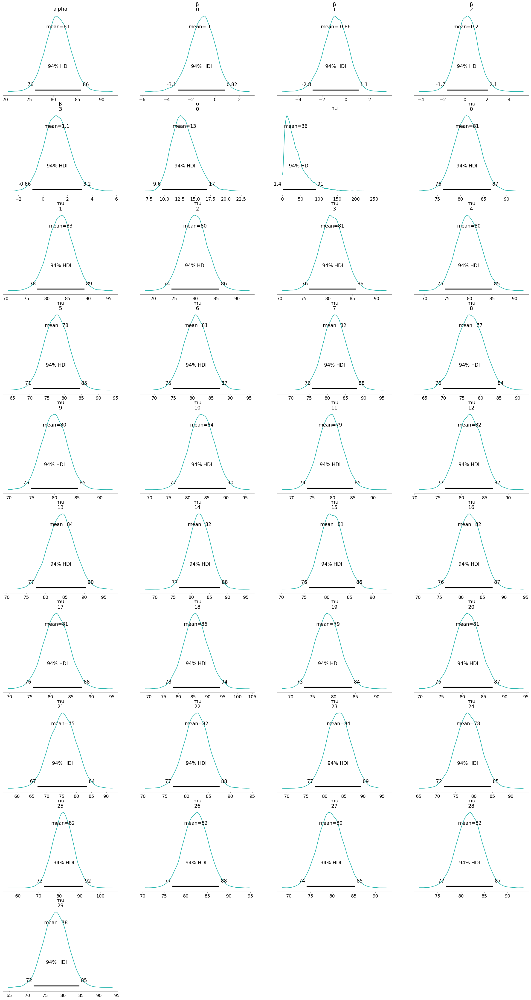

In [66]:
az.plot_posterior(field2022_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

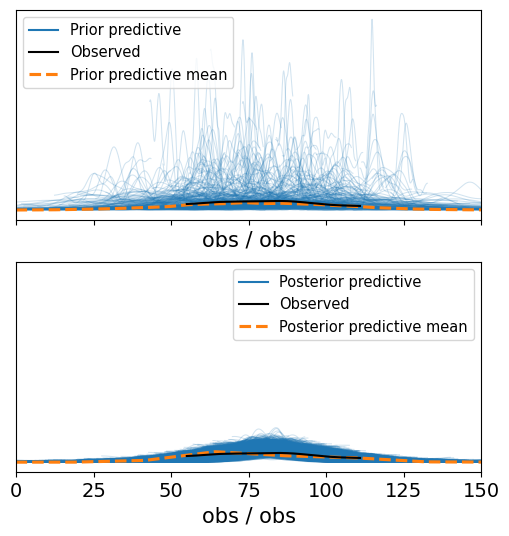

In [67]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(field2022_prior, group = 'prior', ax=ax[0])
az.plot_ppc(field2022_post, ax=ax[1])

# 2023 Fielding

In [68]:
teamfieldstats2023_np=teamfieldstats2023.to_numpy()
response_field2023=teamwinstats2023_field['W']

with pm.Model() as field2023_model:

    X = pm.MutableData("X", teamfieldstats2023_np)
    y = pm.MutableData("y", standings2023)

    alpha = pm.Normal('alpha', mu=81, sigma=25)

    beta = pm.MvStudentT('β', nu = 29, mu=np.zeros(4), Sigma = np.eye(4), shape = 4)

    linear = pm.math.dot(X, beta)

    mu = pm.Deterministic("mu", alpha + linear)

    σ = pm.HalfStudentT('σ',2,8,shape=1)

    nu = pm.Exponential('nu', 1/29.0)+ 1

    obs = pm.StudentT('obs', nu=nu, mu=mu, sigma=σ, observed=y)

In [69]:
with field2023_model:
    field2023_trace = pm.fit(5000,
        method="advi", callbacks=[pm.callbacks.CheckParametersConvergence(diff="absolute")])

Finished [100%]: Average Loss = 125.25


In [70]:
with field2023_model:
    field2023_sample = pm.sample(5000, random_seed = random_seed, return_inferencedata=True, idata_kwargs={'log_likelihood':True})
    field2023_prior = pm.sample_prior_predictive(random_seed=random_seed)
    field2023_post = pm.sample_posterior_predictive(field2023_sample, extend_inferencedata=True)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, β, σ, nu]


Sampling 4 chains for 1_000 tune and 5_000 draw iterations (4_000 + 20_000 draws total) took 4 seconds.
Sampling: [alpha, nu, obs, β, σ]
Sampling: [obs]


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β'}>,
        <Axes: title={'center': 'β'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ'}>,
        <Axes: title={'center': 'σ'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu'}>,
        <Axes: title={'center': 'mu'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

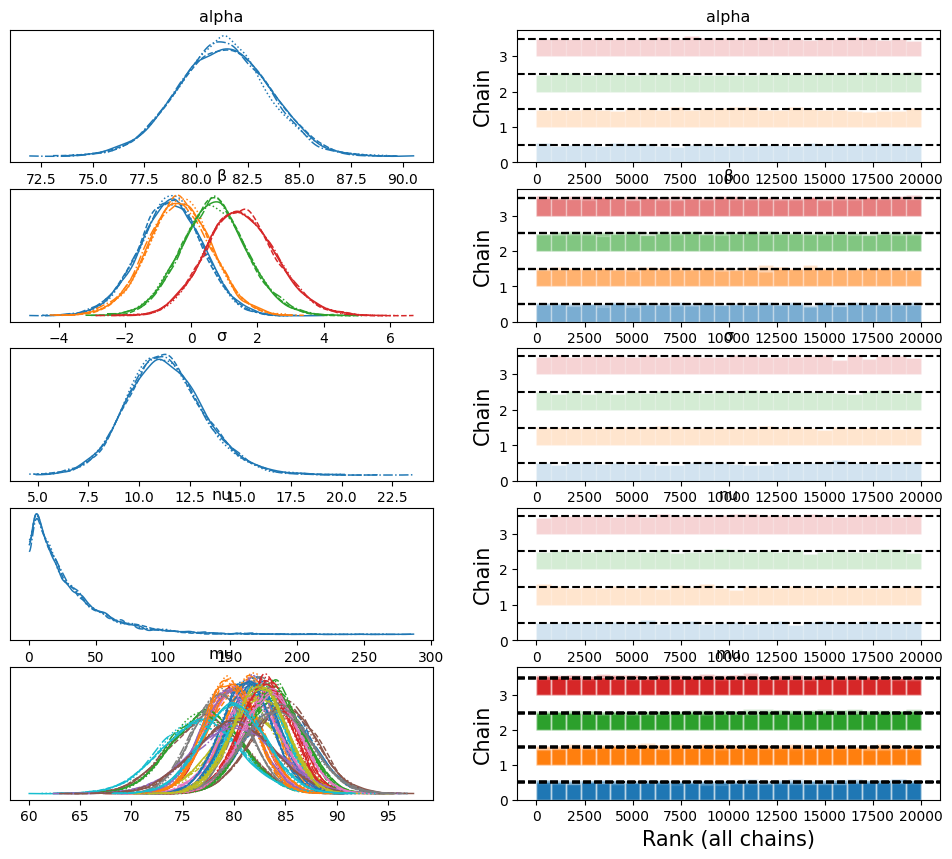

In [71]:
az.plot_trace(field2023_sample, kind = 'rank_bars')

/Users/kevinfinn/anaconda3/lib/python3.10/site-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (37), generating only 20 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n1'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n2'}>,
        <Axes: title={'center': 'β\n2'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'β\n3'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'σ\n0'}>,
        <Axes: title={'center': 'σ\n0'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n0'}, xlabel='Rank (

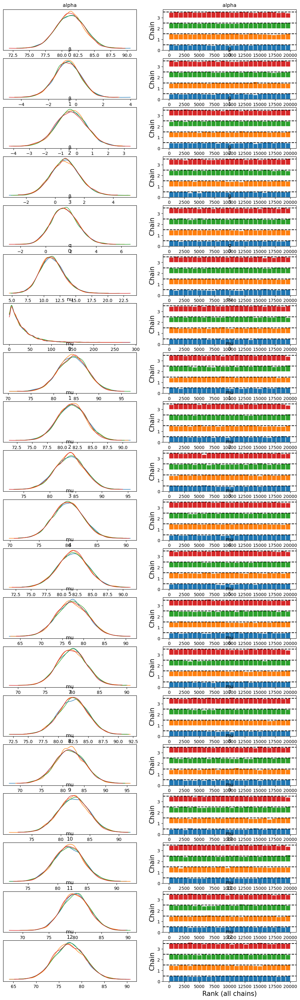

In [72]:
az.plot_trace(field2023_sample, kind = 'rank_bars', compact=False)

In [73]:
az.summary(field2023_sample)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,81.294,2.226,77.255,85.559,0.016,0.011,20664.0,14728.0,1.0
β[0],-0.618,0.970,-2.388,1.276,0.007,0.006,21869.0,14709.0,1.0
β[1],-0.358,0.981,-2.253,1.467,0.006,0.006,23698.0,15739.0,1.0
β[2],0.692,1.003,-1.128,2.665,0.007,0.006,23271.0,15811.0,1.0
β[3],1.505,1.066,-0.497,3.489,0.007,0.006,23333.0,15591.0,1.0
σ[0],11.301,1.955,7.713,15.080,0.016,0.011,14678.0,10591.0,1.0
nu,29.124,28.453,0.001,79.705,0.201,0.151,14764.0,10810.0,1.0
mu[0],84.218,3.235,78.305,90.398,0.022,0.016,21556.0,15654.0,1.0
mu[1],81.561,2.373,77.151,86.098,0.016,0.012,21308.0,14800.0,1.0
mu[2],83.827,2.829,78.594,89.241,0.020,0.014,20869.0,14464.0,1.0


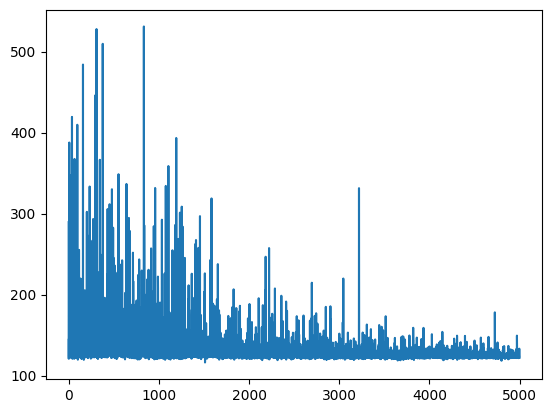

In [74]:
plt.plot(field2023_trace.hist)

array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'β\n0'}>,
        <Axes: title={'center': 'β\n1'}>,
        <Axes: title={'center': 'β\n2'}>],
       [<Axes: title={'center': 'β\n3'}>,
        <Axes: title={'center': 'σ\n0'}>, <Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'mu\n0'}>],
       [<Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'mu\n2'}>,
        <Axes: title={'center': 'mu\n3'}>,
        <Axes: title={'center': 'mu\n4'}>],
       [<Axes: title={'center': 'mu\n5'}>,
        <Axes: title={'center': 'mu\n6'}>,
        <Axes: title={'center': 'mu\n7'}>,
        <Axes: title={'center': 'mu\n8'}>],
       [<Axes: title={'center': 'mu\n9'}>,
        <Axes: title={'center': 'mu\n10'}>,
        <Axes: title={'center': 'mu\n11'}>,
        <Axes: title={'center': 'mu\n12'}>],
       [<Axes: title={'center': 'mu\n13'}>,
        <Axes: title={'center': 'mu\n14'}>,
        <Axes: title={'center': 'mu\n15'}>,
        <Axes: t

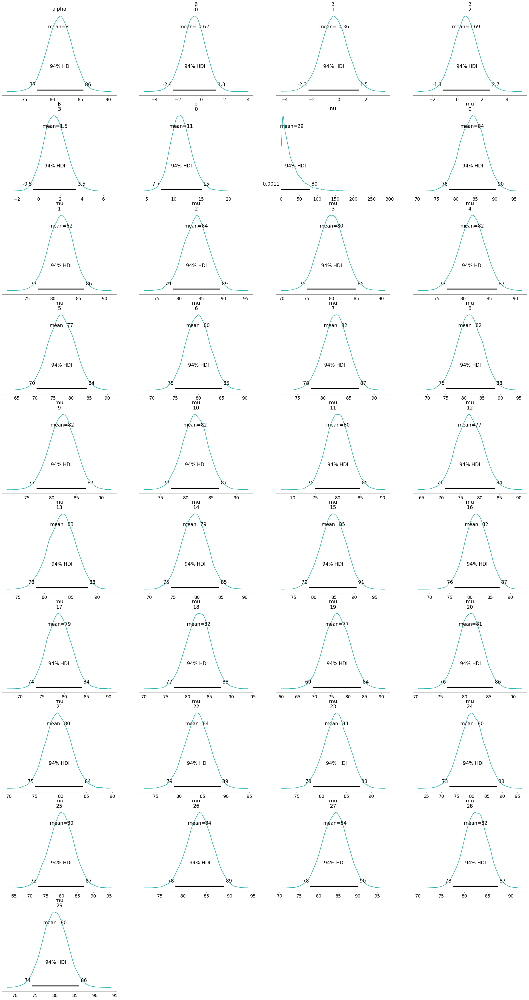

In [75]:
az.plot_posterior(field2023_sample, color="LightSeaGreen")

array([<Axes: xlabel='obs / obs'>], dtype=object)

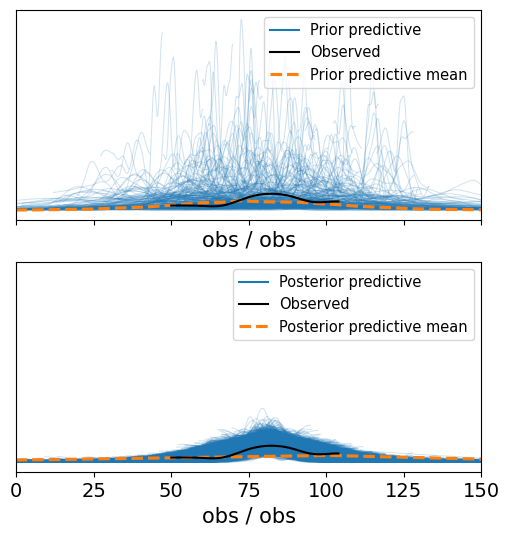

In [76]:
_, ax = plt.subplots(2,1, sharex =True, sharey=True, figsize =(6,6))
ax[0].set_xlim(xmin=0, xmax = 150)
az.plot_ppc(field2023_prior, group = 'prior', ax=ax[0])
az.plot_ppc(field2023_post, ax=ax[1])

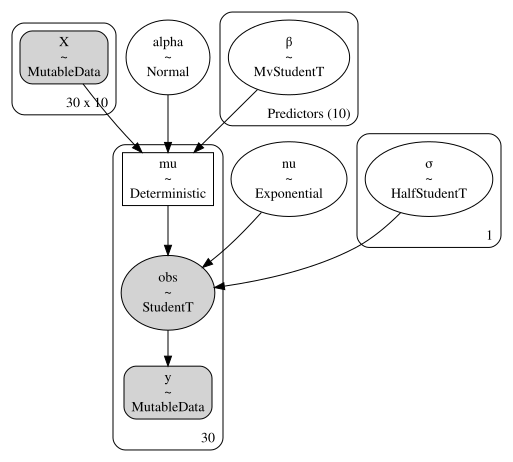

In [186]:
pm.model_to_graphviz(hit2022_model)

In [185]:
conda install -c conda-forge python-graphviz

Retrieving notices: ...working... done
Solving environment: | 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/noarch::tifffile==2021.7.2=pyhd3eb1b0_2
  - defaults/osx-arm64::astropy==5.1=py310h96f19d2_0
  - defaults/osx-arm64::patsy==0.5.3=py310hca03da5_0
  - defaults/osx-arm64::panel==0.14.3=py310hca03da5_0
  - defaults/osx-arm64::bottleneck==1.3.5=py310h96f19d2_0
  - defaults/osx-arm64::datashader==0.14.4=py310hca03da5_0
  - defaults/osx-arm64::scikit-learn==1.2.1=py310h313beb8_0
  - defaults/osx-arm64::pywavelets==1.4.1=py310h80987f9_0
  - defaults/osx-arm64::xarray==2022.11.0=py310hca03da5_0
  - defaults/osx-arm64::pytables==3.7.0=py310ha5d4e50_1
  - defaults/osx-arm64::hvplot==0.8.2=py310hca03da5_0
  - defaults/osx-arm64::gensim==4.3.0=py310h46d7db6_0
  - defaults/osx-arm64::statsmodels==0.13.5=py310hbda83bc_1
  - defaults/osx-arm64::bokeh==2.4.3=py310hca03da5_0
  - defaults/osx-arm64::co

# Stacked model

In [161]:
traces2022 = [field2022_sample, hit2022_sample, pitch2022_sample]
post2022 = [field2022_post, hit2022_post, pitch2022_post]
model_dict2022 = dict(zip(["field2022_model", "hit2022_model", "pitch2022_model"], traces2022))
comp2022 = az.compare(model_dict2022, ic='loo', method='stacking')
comp2022

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
pitch2022_model,0,-100.136140,4.910245,0.000000,8.640286e-01,3.873683,0.000000,False,log
hit2022_model,1,-109.914812,5.357612,9.778672,1.359714e-01,3.468880,5.604354,False,log
field2022_model,2,-122.494247,2.319412,22.358107,4.163003e-12,3.018067,4.408423,False,log


In [165]:
traces2023 = [field2023_sample, hit2023_sample, pitch2023_sample]
post2023 = [field2023_post, hit2023_post, pitch2023_post]
model_dict2023 = dict(zip(["field2023_model", "hit2023_model", "pitch2023_model"], traces2023))
comp2023 = az.compare(model_dict2023)
comp2023

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
hit2023_model,0,-113.155521,4.455800,0.000000,1.000000e+00,3.824762,0.000000,False,log
pitch2023_model,1,-117.821409,3.216931,4.665888,8.493206e-15,3.949668,2.037630,False,log
field2023_model,2,-119.198854,2.988140,6.043333,0.000000e+00,4.341432,2.253897,False,log


In [167]:
ppc_w2022 = az.stats.weight_predictions(
    idatas=traces2022,
    weights=comp2022.weight.sort_index(ascending=True))

In [168]:
ppc_w2023 = az.stats.weight_predictions(
    idatas=traces2023,
    weights=comp2023.weight.sort_index(ascending=True))

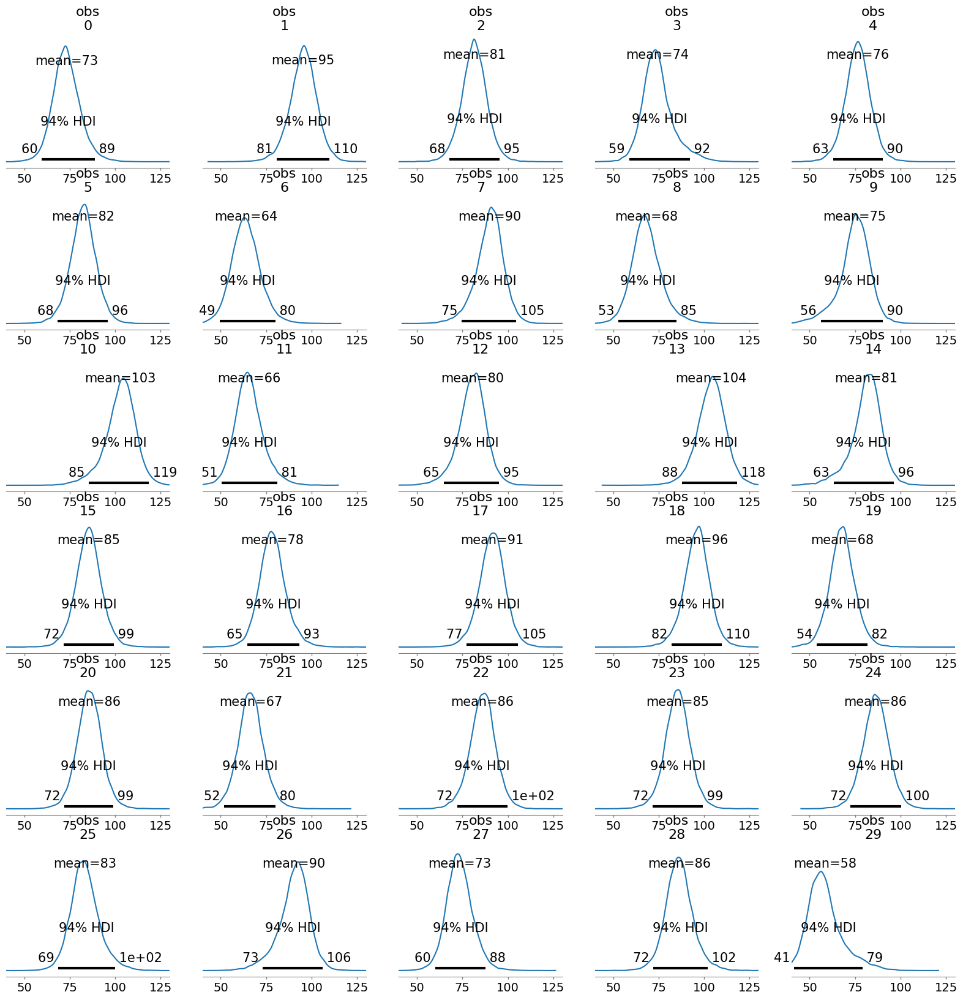

In [169]:
_, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20, 20))

for i in range(6):
    for j in range(5):
        ax[i, j].set_xlim(xmin=40, xmax=130)

az.plot_posterior(ppc_w2022.posterior_predictive, combine_dims={"sample"}, ax=ax.flatten())

plt.show()

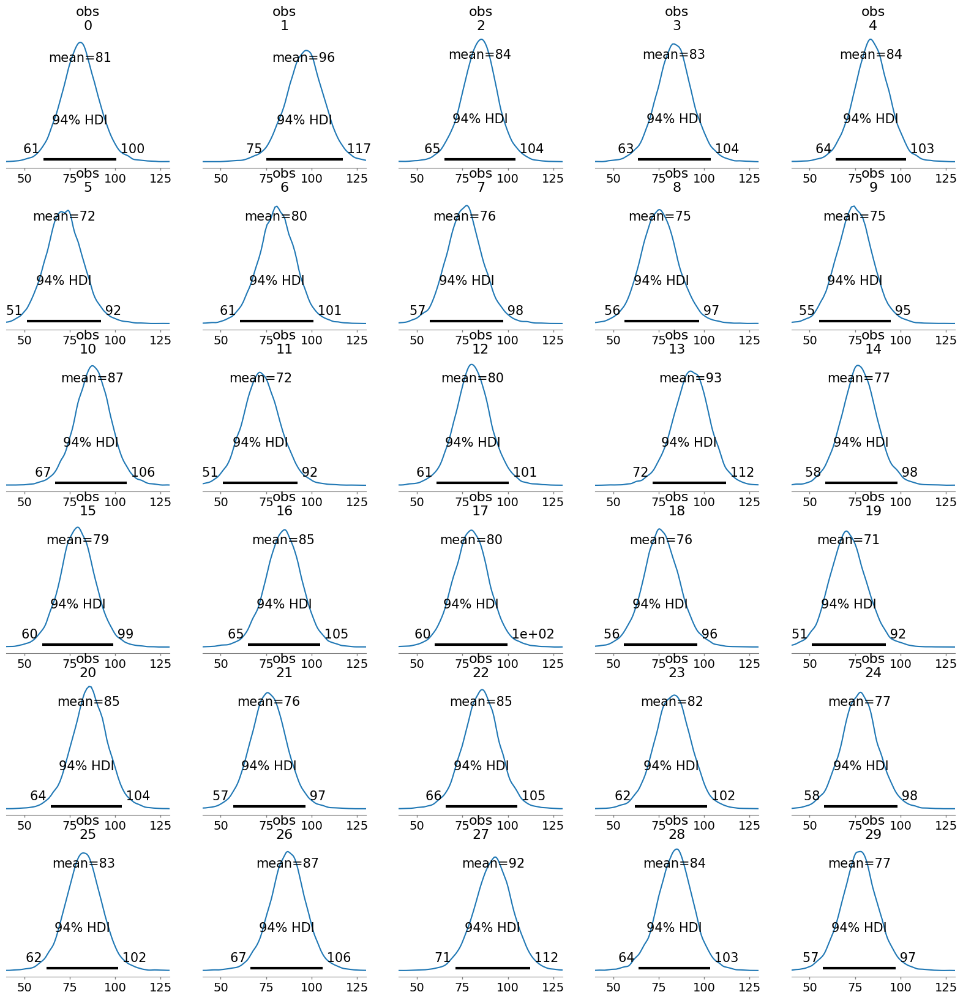

In [170]:
_, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20, 20))

for i in range(6):
    for j in range(5):
        ax[i, j].set_xlim(xmin=40, xmax=130)

az.plot_posterior(ppc_w2023.posterior_predictive, combine_dims={"sample"}, ax=ax.flatten())

plt.show()

In [171]:
weights = [.33]*len(traces2022)
ppc_w2022e = az.stats.weight_predictions(
    idatas=traces2022,
    weights=weights)

In [182]:
weights = [.33]*len(traces2023)
ppc_w2023e = az.stats.weight_predictions(
    idatas=traces2022,
    weights=weights)

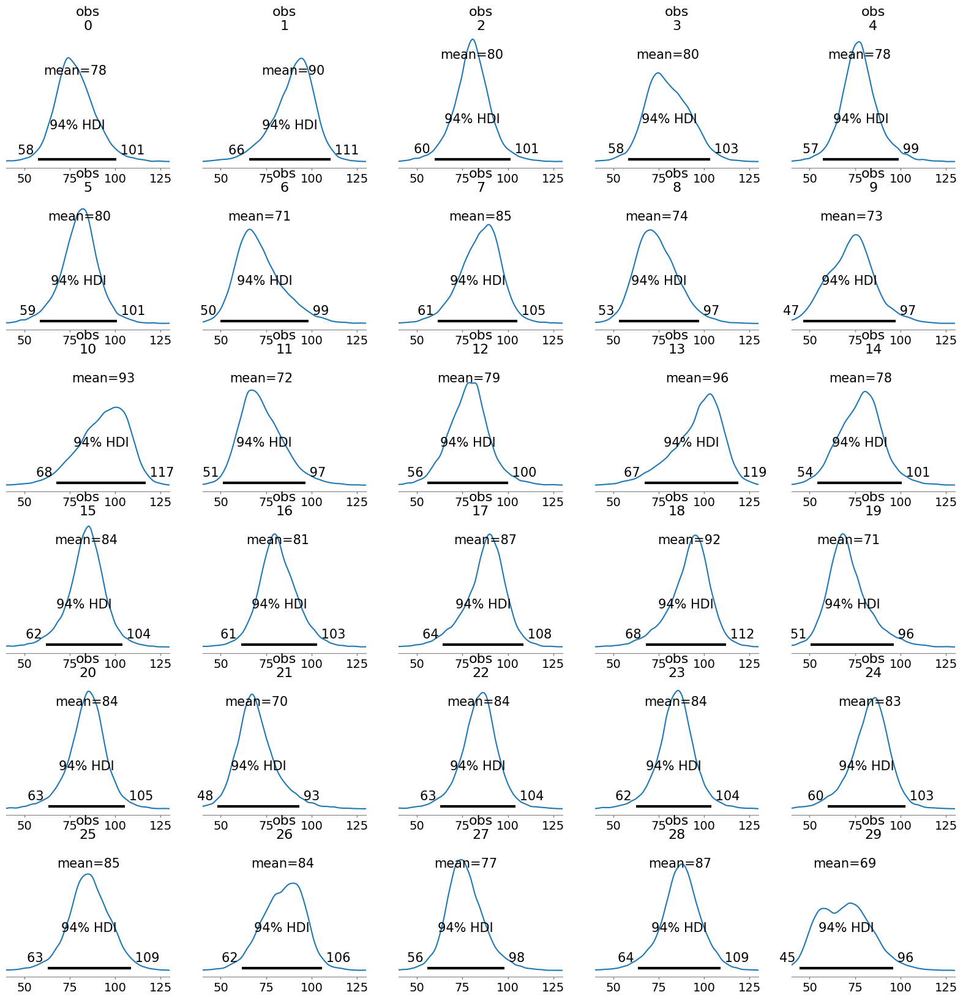

In [173]:
_, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20, 20))

for i in range(6):
    for j in range(5):
        ax[i, j].set_xlim(xmin=40, xmax=130)

az.plot_posterior(ppc_w2022e.posterior_predictive, combine_dims={"sample"}, ax=ax.flatten())

plt.show()

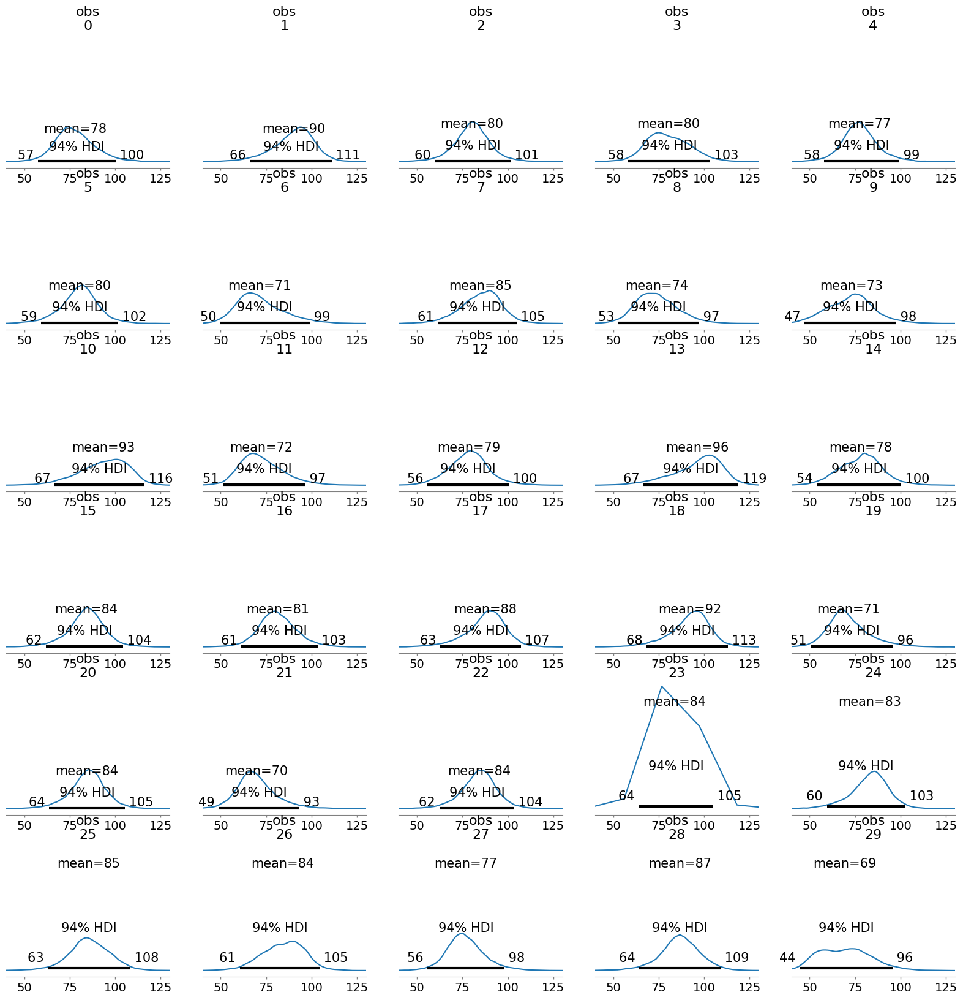

In [174]:
_, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20, 20))

for i in range(6):
    for j in range(5):
        ax[i, j].set_xlim(xmin=40, xmax=130)

az.plot_posterior(ppc_w2023e.posterior_predictive, combine_dims={"sample"}, ax=ax.flatten())

plt.show()